In [1]:
import cv2
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline  
import tensorflow as tf
from glob import glob
from yolov3.yolov4_config import Create_Yolo
from yolov3.utils_config import load_yolo_weights, detect_image
from yolov3.configs_config import *
from PIL import Image

import os
import pandas as pd

if YOLO_TYPE == "yolov4":
    Darknet_weights = YOLO_V4_TINY_WEIGHTS if TRAIN_YOLO_TINY else YOLO_V4_WEIGHTS
if YOLO_TYPE == "yolov3":
    Darknet_weights = YOLO_V3_TINY_WEIGHTS if TRAIN_YOLO_TINY else YOLO_V3_WEIGHTS

yolo = Create_Yolo(input_size=YOLO_INPUT_SIZE)
load_yolo_weights(yolo, Darknet_weights) # use Darknet weights

In [2]:
yolo = Create_Yolo(input_size=YOLO_INPUT_SIZE, CLASSES=TRAIN_CLASSES)
yolo.load_weights("./checkpoints/lip_confience_config/yolov3_custom") # use keras weights

# image path

In [20]:
tr = glob(r"teeth_including_lip_more\train/*.xml")
te = glob(r"teeth_including_lip_more\test/*.xml")
r5 = glob(r"C:\Users\NA_team_1\Desktop\test\*.jpg")

print("train data : {}".format(len(tr)))
print("validation data : {}".format(len(te)))
print("test data {}".format(len(r5)))

train data : 340
validation data : 85
test data 85


In [21]:
r1 = glob(r"teeth_including_lip_more\test/*.jpg")

In [22]:
r11 = glob(r"teeth_including_lip_more\train/*.jpg")

In [23]:
r2 =  glob(r"anomaly_data/*.jpg")

In [24]:
r3 =  glob(r"crop_anomaly/*.jpg")

In [25]:
r4 =  glob(r"use_image_poster\real_anomaly/*.jpg")

In [26]:
# # in dahun computer 
# coco_anomaly =  glob(r"C:\Users\NA_team2\TensorFlow-2.x-YOLOv3\TensorFlow-2.x-YOLOv3\val2017/*.jpg")

In [27]:
coco_anomaly =  glob(r"C:\Users\NA_team_1\Desktop\val2017\*.jpg")
np.random.seed(42)
a = np.random.randint(5000, size =76)
a = np.sort(a)
print(a)
anomaly_76 = [coco_anomaly[i] for i in a]

[  34  130  161  189  241  337  466  474  600  646  769  775  860  878
  975  995 1016 1021 1076 1082 1184 1267 1275 1363 1478 1500 1528 1585
 1685 1806 1899 1955 1981 2041 2047 2061 2363 2391 2433 2435 2556 2558
 2612 2613 2734 2747 2824 2888 2904 2919 3005 3073 3092 3152 3171 3202
 3342 3385 3444 3461 3556 3772 3798 3843 3890 3943 4014 4117 4297 4426
 4551 4555 4658 4798 4843 4911]


In [28]:
coco_center_crop = glob(r"C:\Users\NA_team_1\Desktop\coco_crop\*.jpg")

In [29]:
# braces =  glob(r"C:\Users\NA_team_1\Desktop\GitHub\TensorFlow-2.x-YOLOv3\braces/*.jpg")

In [3]:
brace_path = r"braces"

In [31]:
angled_path = r"angled"

# train

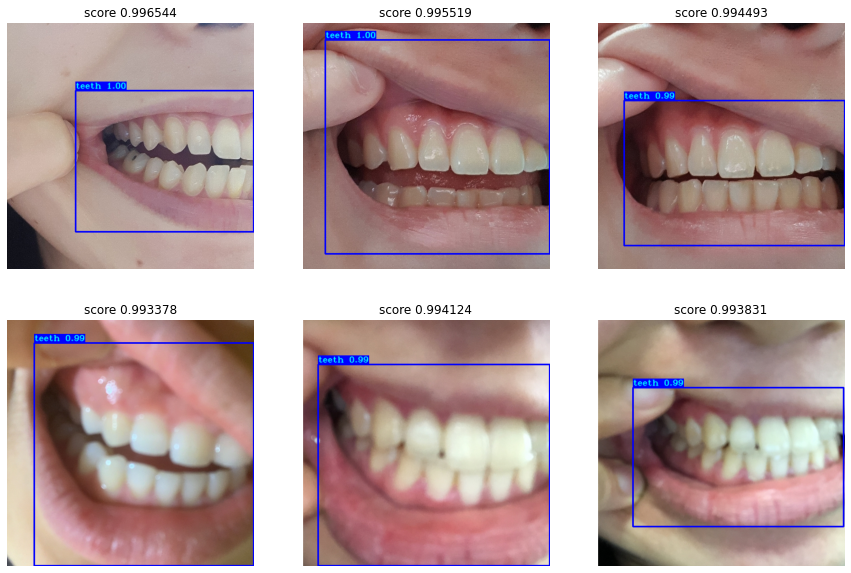

In [32]:
#plt.figure(figsize=(15,30))
#for i in range(18):
#    plt.subplot(6,3,i+1)
plt.figure(figsize=(15,10))
for i in range(6):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r11[i], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.show()

# validation

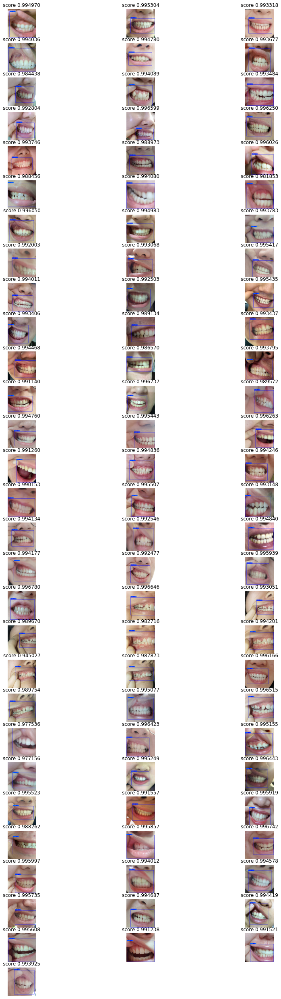

In [33]:
plt.figure(figsize=(15,45))
for i in range(85):
    plt.subplot(29,3,i+1)
# plt.figure(figsize=(15,10))
# for i in range(6):
#     plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r1[i], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.show()

## test

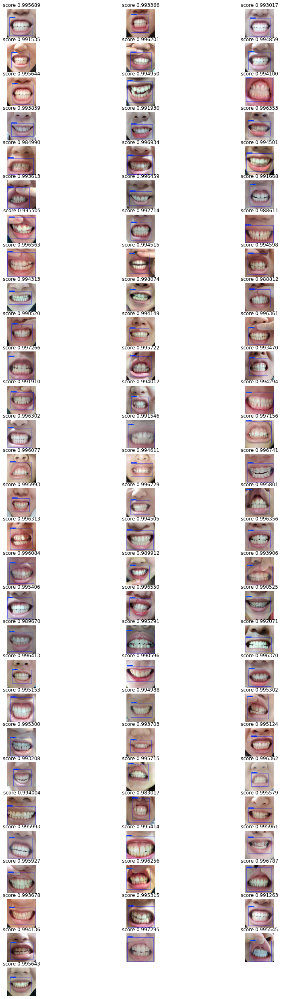

In [34]:
plt.figure(figsize=(15,45))
for i in range(85):
    plt.subplot(29,3,i+1)
# plt.figure(figsize=(15,10))
# for i in range(6):
#     plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r5[i], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.show()

# anomaly

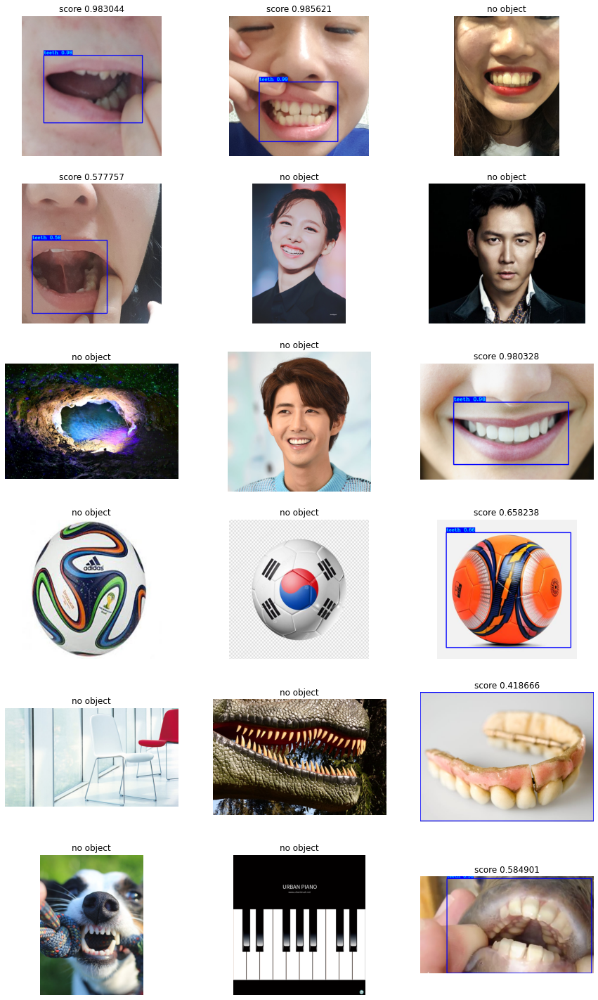

In [35]:
plt.figure(figsize=(15,30))
for i in range(18):
    plt.subplot(7,3,i+1)
# plt.figure(figsize=(15,10))
# for i in range(6):
#     plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r2[i], "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3,CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.show()

# crop anomaly

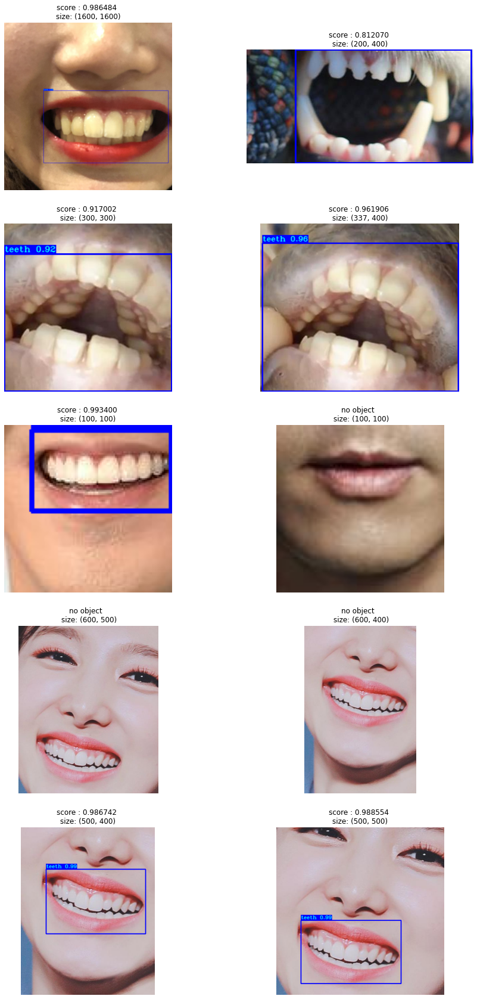

In [36]:
plt.figure(figsize=(15,30))
for i in range(len(r3)):
    plt.subplot(5,2,i+1)
    image, bboxes = detect_image(yolo, r3[i], "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.5 , CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object  \n size: {}'.format(cv2.imread(r3[i]).shape[0:2]))
        plt.axis('off')
    else :
        plt.title('score : {0:2f} \n size: {1} '.format(bboxes[0][4], cv2.imread(r3[i]).shape[0:2]))
        plt.axis('off')
plt.show()

# coco 76

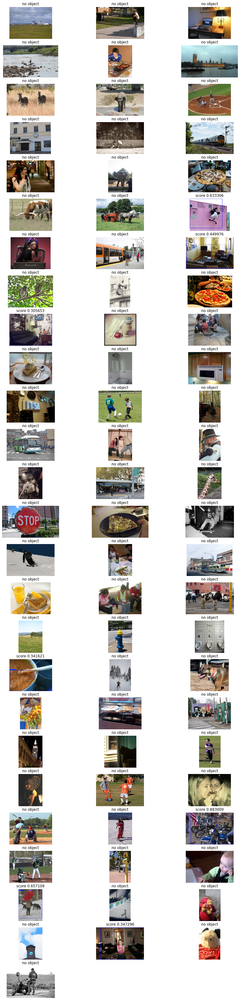

In [37]:
plt.figure(figsize=(15,60))
for i in range(76):
    plt.subplot(26,3,i+1)
# plt.figure(figsize=(15,10))
# for i in range(6):
#     plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, anomaly_76[i], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.show()

# coco 76 center crop

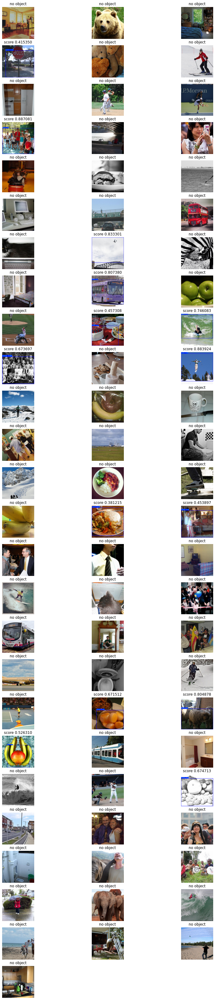

In [38]:
plt.figure(figsize=(15,60))
for i in range(76):
    plt.subplot(26,3,i+1)
# plt.figure(figsize=(15,10))
# for i in range(6):
#     plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, coco_center_crop[i], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.show()

# braces

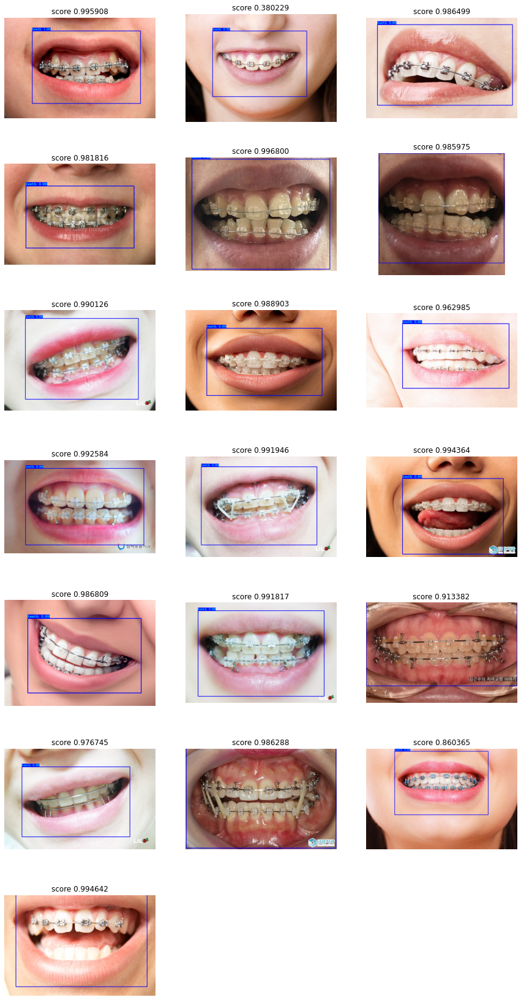

In [4]:
# it contain png files
plt.figure(figsize=(15,30))
for i in range(len(os.listdir(brace_path))):
    plt.subplot(7,3,i+1)
# plt.figure(figsize=(15,10))
# for i in range(6):
#     plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, os.path.join(brace_path, os.listdir(brace_path)[i]), "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3,CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.show()

# angle data

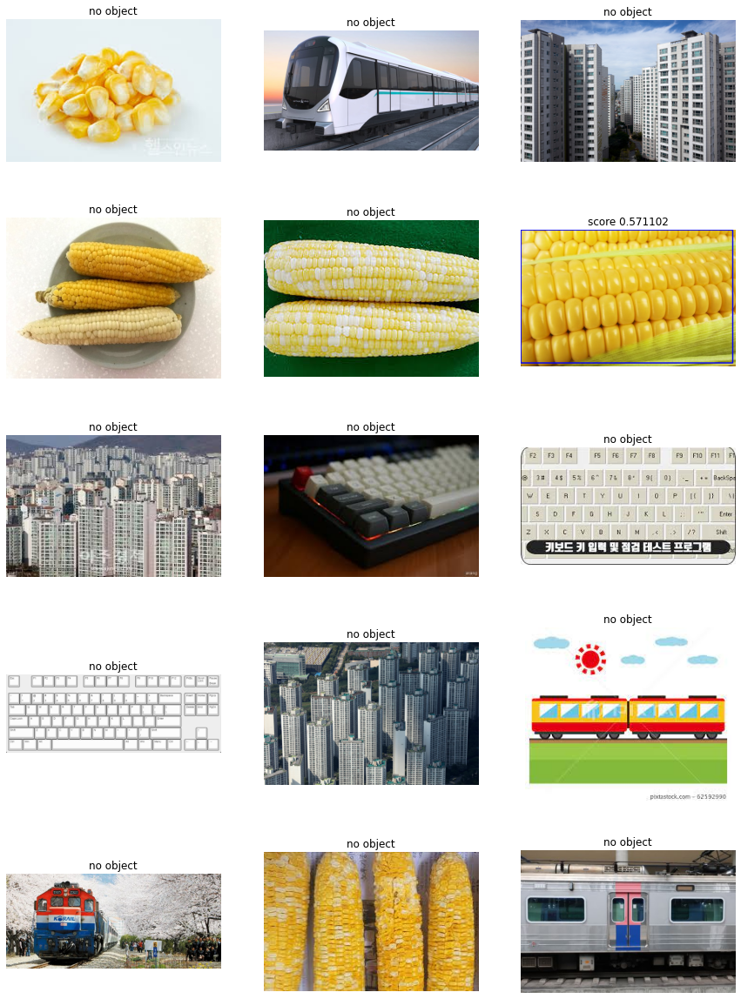

In [40]:
plt.figure(figsize=(15,30))
for i in range(len(os.listdir(angled_path))):
    plt.subplot(7,3,i+1)
# plt.figure(figsize=(15,10))
# for i in range(6):
#     plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, os.path.join(angled_path, os.listdir(angled_path)[i]), "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3,CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.show()

# score evaluate

In [41]:
train_score = [ ]
train_score_i = [ ]
valid_score = []
valid_score_i = []
anomaly_score = []
anomaly_i=[]
center_anomaly_score = []
center_anomaly_i = []

In [42]:
test_score = []
test_score_i = []

In [5]:
braces_score = []
braces_i=[]
angle_score = []
angle_i=[]

In [44]:
full_coco_anomaly_score = []
full_coco_anomaly_i=[]

In [45]:
full_coco_center_anomaly_score = []
full_coco_center_anomaly_i=[]

In [46]:
#train 
for i in range(len(r11)):
    image, bboxes = detect_image(yolo, r11[i], "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3,CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    train_score.append(bboxes[0][4])
    if train_score[i] < 0.85 :
        train_score_i.append(i)
print("training mean: {0:7f}, var : {1:7f}, min : {2:2f}".format(np.mean(train_score), np.var(train_score), np.min(train_score))  )    

training mean: 0.994739, var : 0.000006, min : 0.978927


In [47]:
#validation
for i in range(len(r1)):
    image, bboxes = detect_image(yolo, r1[i], "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    valid_score.append(bboxes[0][4])
    if valid_score[i] < 0.85 :
        valid_score_i.append(i)
#     print(i ,bboxes)
print("validation mean: {0:7f}, var : {1:7f}, min : {2:2f}".format(np.mean(valid_score), np.var(valid_score) , np.min(valid_score)))

validation mean: 0.992460, var : 0.000042, min : 0.945027


In [48]:
#test
for i in range(len(r5)):
    image, bboxes = detect_image(yolo, r5[i], "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    test_score.append(bboxes[0][4])
    if test_score[i] < 0.85 :
        test_score_i.append(i)
#     print(i ,bboxes)
print("test mean: {0:7f}, var : {1:7f}, min : {2:2f}".format(np.mean(test_score), np.var(test_score) , np.min(test_score)))

test mean: 0.994337, var : 0.000007, min : 0.983017


In [49]:
#anomaly 85
anomaly_85 = anomaly_76 + r2[-9:]
for i in range(len(anomaly_85)):
    image, bboxes = detect_image(yolo, anomaly_85[i], "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3,CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    if len(bboxes)!=0:
        anomaly_score.append(bboxes[0][4])
        anomaly_i.append(i)

In [50]:
#anomaly 85
print("Wrong 85 anomaly set")
# print("The number of wrong",len(full_coco_anomaly_i))
for i in range(len(anomaly_i)):
    print("coco data : {0}, score : {1:4f}".format(anomaly_i[i], anomaly_score[i]))

Wrong 85 anomaly set
coco data : 17, score : 0.633306
coco data : 20, score : 0.449976
coco data : 24, score : 0.305653
coco data : 51, score : 0.341621
coco data : 65, score : 0.883009
coco data : 69, score : 0.657109
coco data : 73, score : 0.347296
coco data : 78, score : 0.658238
coco data : 81, score : 0.418666
coco data : 84, score : 0.584901


In [51]:
#coco anomaly full
for i in range(len(coco_anomaly)):
    image, bboxes = detect_image(yolo, coco_anomaly[i], "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3,CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    if len(bboxes)!=0:
        full_coco_anomaly_score.append(bboxes[0][4])
        full_coco_anomaly_i.append(i)

over_anomaly_score = [i for i in full_coco_anomaly_score if i>0.8]
over_anomaly_i = []

for i in range(len(full_coco_anomaly_score)):
    if full_coco_anomaly_score[i] in over_anomaly_score :
        over_anomaly_i.append(full_coco_anomaly_i[i])

In [ ]:
#coco center anomaly full
for i in range(len(coco_center_crop)):
    image, bboxes = detect_image(yolo, coco_center_crop[i], "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3,CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    if len(bboxes)!=0:
        full_coco_center_anomaly_score.append(bboxes[0][4])
        full_coco_center_anomaly_i.append(i)

over_center_anomaly_score = [i for i in full_coco_center_anomaly_score if i>0.8]
over_center_anomaly_i = []

for i in range(len(full_coco_center_anomaly_score)):
    if full_coco_center_anomaly_score[i] in over_center_anomaly_score :
        over_center_anomaly_i.append(full_coco_center_anomaly_i[i])

In [6]:
#braces 
for i in range(len(os.listdir(brace_path))):
    image, bboxes = detect_image(yolo, os.path.join(brace_path, os.listdir(brace_path)[i]), "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3,CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    if len(bboxes)!=0:
        braces_score.append(bboxes[0][4])
        braces_i.append(i)
        
under_braces_score = [i for i in braces_score if i<0.85]
under_braces_i= []

for i in range(len(braces_score)):
    if braces_score[i] in under_braces_score :
        under_braces_i.append(braces_i[i])

In [53]:
# angle
for i in range(len(os.listdir(angled_path))):
    image, bboxes = detect_image(yolo, os.path.join(angled_path, os.listdir(angled_path)[i]), "", input_size=YOLO_INPUT_SIZE, show=False, score_threshold = 0.3,CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    if len(bboxes)!=0:
        angle_score.append(bboxes[0][4])
        angle_i.append(i)

over_angle_score = [i for i in angle_score if i>0.5]
over_angle_i= []

for i in range(len(angle_score)):
    if angle_score[i] in over_angle_score :
        over_angle_i.append(angle_i[i])

In [54]:
print("Wrong training set")
for i in range(len(train_score_i)):
    print("training data : {0},  score : {1:4f}".format(train_score_i[i], train_score[train_score_i[i]]))

Wrong training set


In [55]:
print("Wrong valid set")
for i in range(len(valid_score_i)):
    print("test data : {0}, score : {1:4f}".format(valid_score_i[i], valid_score[valid_score_i[i]]))

Wrong valid set


In [56]:
for i in range(len(full_coco_anomaly_score)):
    print(full_coco_anomaly_score[i])

0.8081071376800537
0.47780299186706543
0.6045128703117371
0.46098729968070984
0.41776877641677856
0.7836688756942749
0.36670857667922974
0.403522253036499
0.35527729988098145
0.42843303084373474
0.6573711037635803
0.8064613938331604
0.5395934581756592
0.7149664759635925
0.7534967660903931
0.7669556736946106
0.6567308306694031
0.39198774099349976
0.6379373073577881
0.46310022473335266
0.46739432215690613
0.5197765231132507
0.43758687376976013
0.7887189388275146
0.32113316655158997
0.5788344740867615
0.9256415963172913
0.3413236439228058
0.6429640650749207
0.6644458770751953
0.7524563074111938
0.6372652053833008
0.8177490234375
0.7533379197120667
0.5370016098022461
0.6647258996963501
0.977027177810669
0.3710802495479584
0.8781490325927734
0.6477060914039612
0.75696861743927
0.7510960102081299
0.6755021810531616
0.4470043480396271
0.7166510224342346
0.42696458101272583
0.3871058225631714
0.6922284364700317
0.313516229391098
0.8400289416313171
0.6919803023338318
0.44351035356521606
0.31069

In [57]:
#full coco
print("Wrong anomaly set")
# print("The number of wrong",len(full_coco_anomaly_i))
for i in range(len(over_anomaly_i)):
    print("coco data : {0}, score : {1:4f}".format(over_anomaly_i[i], over_anomaly_score[i]))

Wrong anomaly set
coco data : 9, score : 0.808107
coco data : 62, score : 0.806461
coco data : 280, score : 0.925642
coco data : 380, score : 0.817749
coco data : 405, score : 0.977027
coco data : 454, score : 0.878149
coco data : 565, score : 0.840029
coco data : 595, score : 0.803737
coco data : 644, score : 0.983004
coco data : 857, score : 0.924657
coco data : 940, score : 0.936098
coco data : 954, score : 0.847185
coco data : 1065, score : 0.856020
coco data : 1097, score : 0.858956
coco data : 1172, score : 0.903094
coco data : 1458, score : 0.888654
coco data : 1782, score : 0.830542
coco data : 1922, score : 0.878535
coco data : 2090, score : 0.915636
coco data : 2174, score : 0.816263
coco data : 2188, score : 0.929740
coco data : 2258, score : 0.803238
coco data : 2268, score : 0.956110
coco data : 2271, score : 0.820162
coco data : 2368, score : 0.828972
coco data : 2437, score : 0.951395
coco data : 2531, score : 0.827825
coco data : 2576, score : 0.960630
coco data : 2684,

In [ ]:
#full coco_center 
print("Wrong anomaly set")
# print("The number of wrong",len(full_coco_anomaly_i))
for i in range(len(over_center_anomaly_i)):
    print("coco data : {0}, score : {1:4f}".format(over_center_anomaly_i[i], over_center_anomaly_score[i]))

In [58]:
# angle
print("Wrong anomaly set")
# print("The number of wrong",len(full_coco_anomaly_i))
for i in range(len(over_angle_i)):
    print("angle data : {0}, score : {1:4f}".format(over_angle_i[i], over_angle_score[i]))

Wrong anomaly set
angle data : 5, score : 0.571102


In [7]:
# brace
print("braces set")
# print("The number of wrong",len(full_coco_anomaly_i))
for i in range(len(braces_i)):
    print("brace data : {0}, score : {1:4f}".format(braces_i[i], braces_score[i]))

braces set
brace data : 0, score : 0.995908
brace data : 1, score : 0.380229
brace data : 2, score : 0.986499
brace data : 3, score : 0.981816
brace data : 4, score : 0.996800
brace data : 5, score : 0.985975
brace data : 6, score : 0.990126
brace data : 7, score : 0.988903
brace data : 8, score : 0.962985
brace data : 9, score : 0.992584
brace data : 10, score : 0.991946
brace data : 11, score : 0.994364
brace data : 12, score : 0.986809
brace data : 13, score : 0.991817
brace data : 14, score : 0.913382
brace data : 15, score : 0.976745
brace data : 16, score : 0.986288
brace data : 17, score : 0.860365
brace data : 18, score : 0.994642


In [8]:
# brace
print("Wrong anomaly set")
# print("The number of wrong",len(full_coco_anomaly_i))
for i in range(len(braces_i)):
    if braces_score[i]>0.8:
        print("brace data : {0}, score : {1:4f}".format(braces_i[i], braces_score[i]))

Wrong anomaly set
brace data : 0, score : 0.995908
brace data : 2, score : 0.986499
brace data : 3, score : 0.981816
brace data : 4, score : 0.996800
brace data : 5, score : 0.985975
brace data : 6, score : 0.990126
brace data : 7, score : 0.988903
brace data : 8, score : 0.962985
brace data : 9, score : 0.992584
brace data : 10, score : 0.991946
brace data : 11, score : 0.994364
brace data : 12, score : 0.986809
brace data : 13, score : 0.991817
brace data : 14, score : 0.913382
brace data : 15, score : 0.976745
brace data : 16, score : 0.986288
brace data : 17, score : 0.860365
brace data : 18, score : 0.994642


# Comparing image

In [61]:
os.mkdir("./image_compare_2")

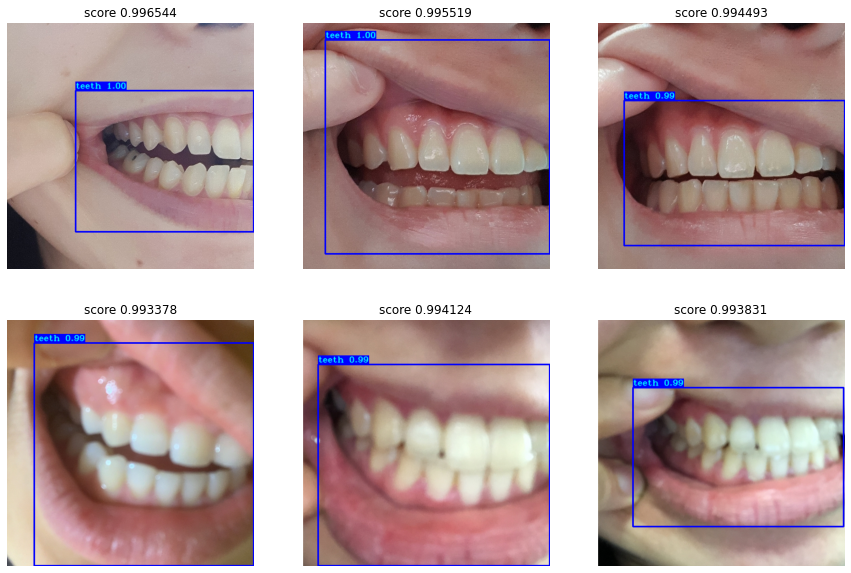

In [62]:
#train good
plt.figure(figsize=(15,10))
for i in range(6):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r11[i], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/train_good.jpg",bbox_inches = "tight")

In [63]:
#train bad 6 picture
if len(train_score_i)>6 : 
    roof = 6
else: 
    roof = len(train_score_i)
bad_case_train_sort = np.argsort([i for i in train_score if i<0.85])

plt.figure(figsize=(15,10))
for i in range(roof):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r11[train_score_i[bad_case_train_sort[i]]], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/train_bad.jpg",bbox_inches = "tight")

<Figure size 1080x720 with 0 Axes>

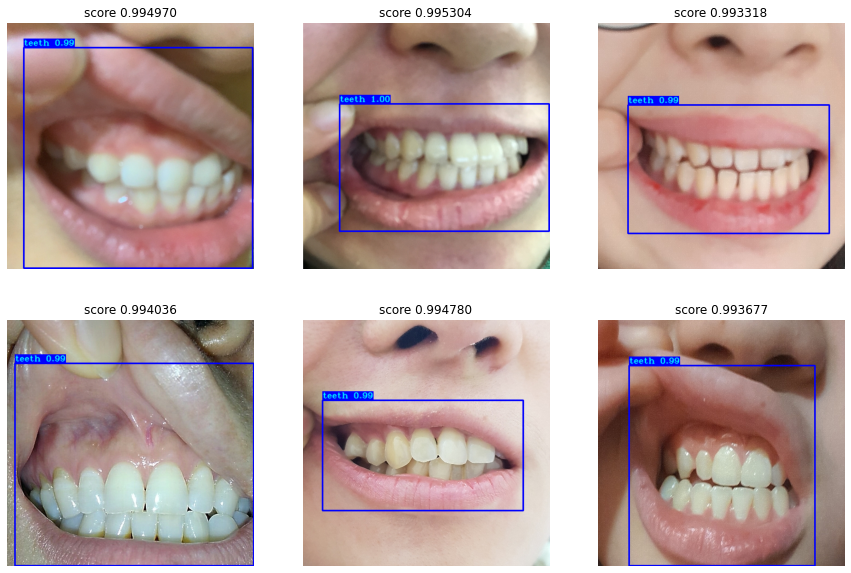

In [64]:
#test good
plt.figure(figsize=(15,10))
for i in range(6):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r1[i], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/valid_good.jpg",bbox_inches = "tight")

In [65]:
#test bad 6 picture
if len(valid_score_i)>6 : 
    roof = 6
else: 
    roof = len(valid_score_i)
bad_case_valid_sort = np.argsort([i for i in valid_score if i<0.85])

plt.figure(figsize=(15,10))
for i in range(roof):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r1[valid_score_i[bad_case_valid_sort[i]]], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/valid_bad.jpg",bbox_inches = "tight")

<Figure size 1080x720 with 0 Axes>

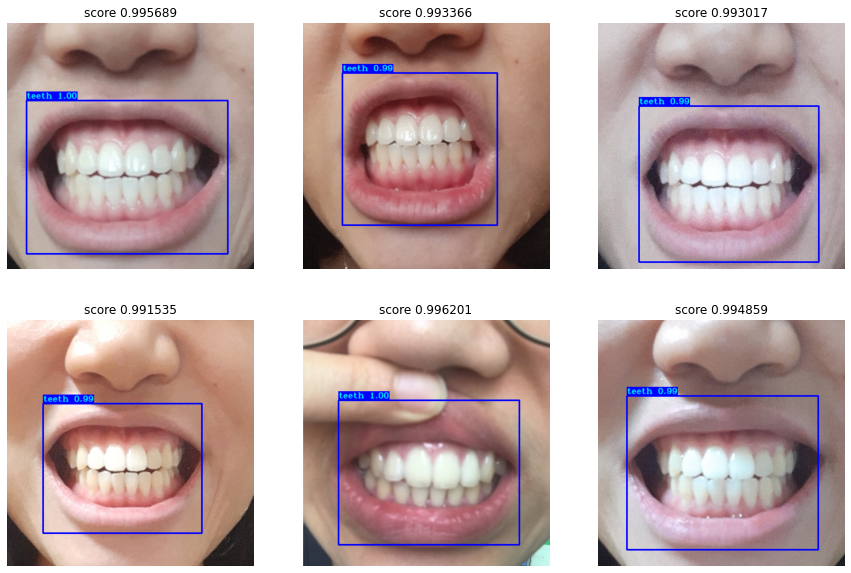

In [66]:
#test good
plt.figure(figsize=(15,10))
for i in range(6):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r5[i], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/test_good.jpg",bbox_inches = "tight")

In [67]:
#test bad 6 picture
if len(test_score_i)>6 : 
    roof = 6
else: 
    roof = len(test_score_i)
bad_case_test_sort = np.argsort([i for i in test_score if i<0.85])

plt.figure(figsize=(15,10))
for i in range(roof):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r5[test_score_i[bad_case_test_sort[i]]], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/test_bad.jpg",bbox_inches = "tight")

<Figure size 1080x720 with 0 Axes>

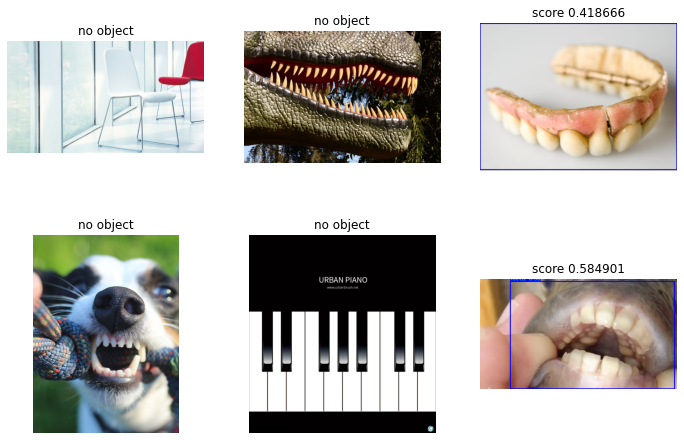

In [68]:
#anomaly
plt.figure(figsize=(12,8))
for i in range(6):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, r2[-6:][i], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/anomaly.jpg",bbox_inches = "tight")

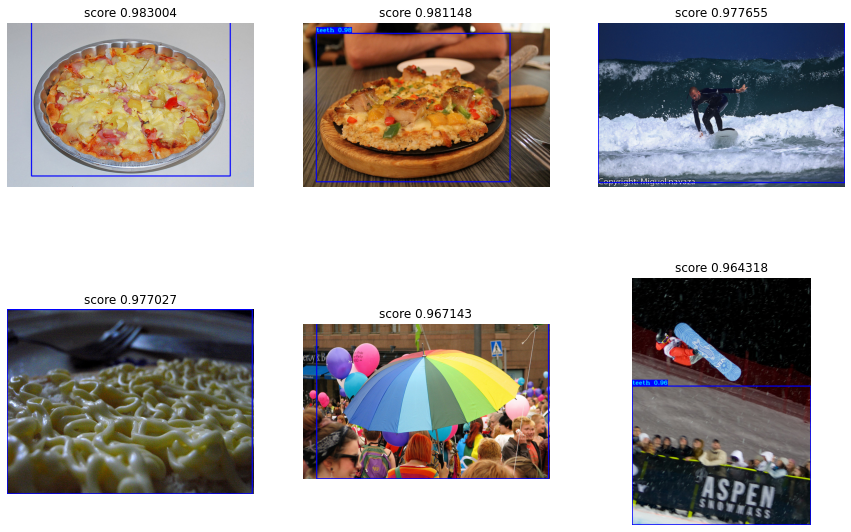

In [69]:
#coco bad 6 picture
bad_case_coco_sort_decent = np.argsort(over_anomaly_score)[::-1]
if len(bad_case_coco_sort_decent)>6 : 
    roof = 6
else: 
    roof = len(bad_case_coco_sort_decent)

plt.figure(figsize=(15,10))
for i in range(roof):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, coco_anomaly[over_anomaly_i[bad_case_coco_sort_decent[i]]], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/coco_bad.jpg",bbox_inches = "tight")

In [ ]:
#coco_center bad 6 picture
bad_case_coco_sort_decent = np.argsort(over_center_anomaly_score)[::-1]
if len(bad_case_coco_sort_decent)>6 : 
    roof = 6
else: 
    roof = len(bad_case_coco_sort_decent)

plt.figure(figsize=(15,10))
for i in range(roof):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, coco_center_crop[over_center_anomaly_i[bad_case_coco_sort_decent[i]]], "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/center_coco_bad.jpg",bbox_inches = "tight")

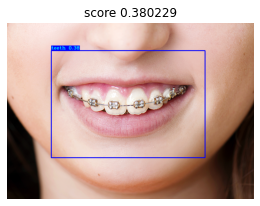

In [9]:
#braces bad 6 picture
bad_case_braces_sort_decent = np.argsort(under_braces_score)
if len(bad_case_braces_sort_decent)>6 : 
    roof = 6
else: 
    roof = len(bad_case_braces_sort_decent)

plt.figure(figsize=(15,10))
for i in range(roof):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, os.path.join(brace_path, os.listdir(brace_path)[under_braces_i[bad_case_braces_sort_decent[i]]]), "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/braces_bad.jpg",bbox_inches = "tight")

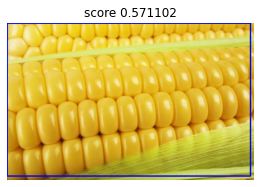

In [71]:
#angle bad 6 picture
bad_case_angle_sort_decent = np.argsort(over_angle_score)[::-1]
if len(bad_case_angle_sort_decent)>6 : 
    roof = 6
else: 
    roof = len(bad_case_angle_sort_decent)

plt.figure(figsize=(15,10))
for i in range(roof):
    plt.subplot(2,3,i+1)
    image, bboxes = detect_image(yolo, os.path.join(angled_path, os.listdir(angled_path)[over_angle_i[bad_case_angle_sort_decent[i]]]), "", input_size=YOLO_INPUT_SIZE, show=False, CLASSES=TRAIN_CLASSES, rectangle_colors=(255,0,0))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    if len(bboxes) == 0 :
        plt.title('no object')
        plt.axis('off')
    else :
        plt.title('score {0:2f}'.format(bboxes[0][4]))
        plt.axis('off')
plt.savefig("./image_compare_2/angle_bad.jpg",bbox_inches = "tight")